# Dataset: This project utilizes a dataset containing time, current, voltage, and temperature data. The goal is to predict temperature using a machine learning approach.

In the future, this method can be applied in industries such as Battery Management Systems, Energy Storage, and Electric Vehicles, where accurate temperature prediction can enhance performance, efficiency, and safety by optimizing battery operation and extending lifespan.

#Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Import Dataset

In [ ]:
# Load the dataset from a CSV file
df = pd.read_csv('/content/sample_data/battery_data.csv')  # Replace with the actual file path or URL

In [ ]:
df.head()

,Time,Current,Voltage,Temperature
0,0.000000,2.158704,2.999607,26.384377
1,1.000000,2.287674,2.999407,26.227879
2,2.000000,2.228280,2.999757,26.449251
3,2.999992,2.224886,2.999857,26.277494
4,4.000000,2.134946,2.999958,26.380539


#Max value Min value

In [ ]:
# Get minimum values
min_values = df.min()

# Get maximum values
max_values = df.max()

# Print results
print("🔹 **Minimum Values:**")
print(min_values)
print("\n🔹 **Maximum Values:**")
print(max_values)

🔹 **Minimum Values:**
Time            0.000000
Current       -20.105541
Voltage         2.998705
Temperature    24.823212
dtype: float64

🔹 **Maximum Values:**
Time           247121.000000
Current            20.402828
Voltage             4.200569
Temperature        27.113413
dtype: float64


#Visualize the dataset

In [ ]:
# Plot Current vs Index
fig_current = px.line(df, x=df.index, y='Current', title='Current vs Index')
fig_current.update_layout(xaxis_title='Index', yaxis_title='Current')
fig_current.show()

# Plot Voltage vs Index
fig_voltage = px.line(df, x=df.index, y='Voltage', title='Voltage vs Index')
fig_voltage.update_layout(xaxis_title='Index', yaxis_title='Voltage')
fig_voltage.show()

# Plot Temperature vs Index
fig_temperature = px.line(df, x=df.index, y='Temperature', title='Temperature vs Index')
fig_temperature.update_layout(xaxis_title='Index', yaxis_title='Temperature')
fig_temperature.show()

#as x axis has much more data see this differently

In [ ]:
import plotly.express as px

# Use the original DataFrame without downsampling
# If needed, reset the index
df.reset_index(drop=True, inplace=True)

# Plot Current vs Index with a range slider using scatter plot
fig_current = px.scatter(df, x=df.index, y='Current', title='Current vs Index')
fig_current.update_layout(
    xaxis_title='Index',
    yaxis_title='Current',
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="linear"
    )
)
fig_current.show()

# Repeat for Voltage using scatter plot
fig_voltage = px.scatter(df, x=df.index, y='Voltage', title='Voltage vs Index')
fig_voltage.update_layout(
    xaxis_title='Index',
    yaxis_title='Voltage',
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="linear"
    )
)
fig_voltage.show()

# Repeat for Temperature using scatter plot
fig_temperature = px.scatter(df, x=df.index, y='Temperature', title='Temperature vs Index')
fig_temperature.update_layout(
    xaxis_title='Index',
    yaxis_title='Temperature',
    xaxis=dict(
        rangeslider=dict(visible=True),
        type="linear"
    )
)
fig_temperature.show()

#Check the Dataset

In [ ]:
print(df.head())

       Time   Current   Voltage  Temperature
0  0.000000  2.158704  2.999607    26.384377
1  1.000000  2.287674  2.999407    26.227879
2  2.000000  2.228280  2.999757    26.449251
3  2.999992  2.224886  2.999857    26.277494
4  4.000000  2.134946  2.999958    26.380539


In [ ]:
print("Column Names:")
print(df.columns)

Column Names:
Index(['Time', 'Current', 'Voltage', 'Temperature'], dtype='object')


In [ ]:
print("\nIndex Information:")
print(df.index)


Index Information:
RangeIndex(start=0, stop=247122, step=1)


In [ ]:
print("\nDataFrame Shape:")
print(df.shape)


DataFrame Shape:
(247122, 4)


In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247122 entries, 0 to 247121
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Time         247122 non-null  float64
 1   Current      247122 non-null  float64
 2   Voltage      247122 non-null  float64
 3   Temperature  247122 non-null  float64
dtypes: float64(4)
memory usage: 7.5 MB
None


In [ ]:
print(df.describe())

                Time        Current        Voltage    Temperature
count  247122.000000  247122.000000  247122.000000  247122.000000
mean   123560.500000      -0.084135       3.794688      25.838993
std     71338.120949      19.591811       0.222793       0.252394
min         0.000000     -20.105541       2.998705      24.823212
25%     61780.250003     -19.959602       3.667008      25.651503
50%    123560.500000      -2.934751       3.799146      25.819445
75%    185340.750000      20.053252       3.949267      26.021742
max    247121.000000      20.402828       4.200569      27.113413


#Correlation Matrix

In [ ]:
correlation_matrix = df.corr()
print(correlation_matrix)

                 Time   Current   Voltage  Temperature
Time         1.000000  0.014439  0.103980    -0.069662
Current      0.014439  1.000000 -0.385535    -0.341858
Voltage      0.103980 -0.385535  1.000000     0.032781
Temperature -0.069662 -0.341858  0.032781     1.000000


#Heatmap

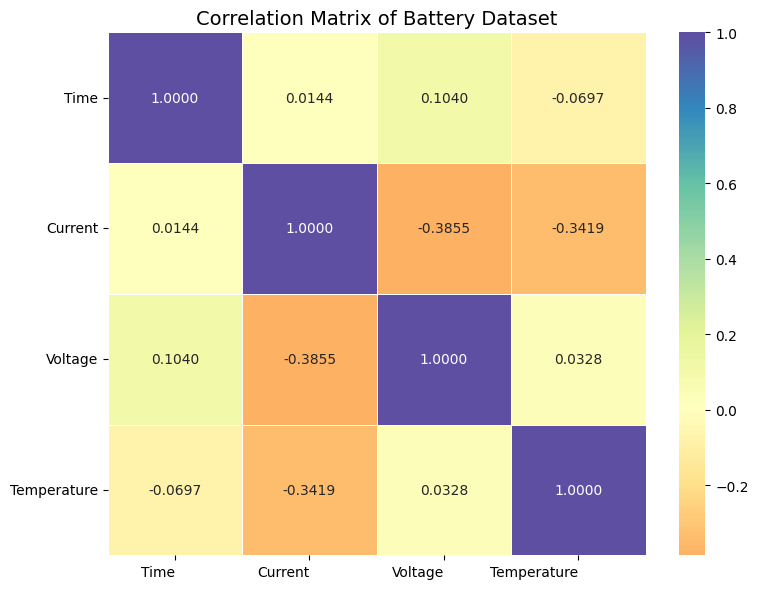

In [ ]:
plt.figure(figsize=(8, 6))

# Create the heatmap with an enhanced colormap
sns.heatmap(correlation_matrix, annot=True, cmap='Spectral', center=0, fmt=".4f", linewidths=0.5)

plt.title('Correlation Matrix of Battery Dataset', fontsize=14)
plt.xticks(rotation=0, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

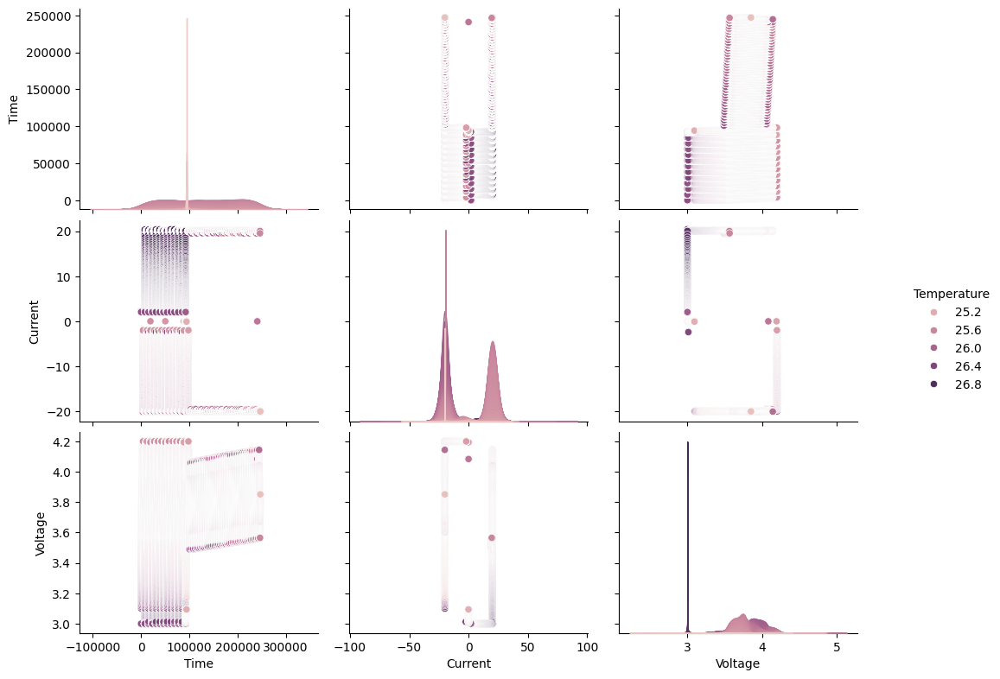

In [ ]:
# Define pairplot with a fixed height
g = sns.pairplot(df, hue="Temperature", height=2.5)  # Height per subplot

# Adjust overall figure size
g.fig.set_size_inches(12, 8)  # (Width, Height)
plt.show()

In [ ]:
print(df.isnull().sum())

Time           0
Current        0
Voltage        0
Temperature    0
dtype: int64


#Renaming the columns

In [ ]:
df.rename(columns={
    'Time (s)': 'Time',
    'Current (A)': 'Current',
    'Voltage (V)': 'Voltage',
    'Temperature (°C)': 'Temperature'
}, inplace=True)

In [ ]:
X = df[['Time', 'Current', 'Voltage']]
y = df['Temperature']

#Splitting Train Test

In [ ]:
# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.2, random_state=42
# )

In [ ]:
cnt-1
#split() method generate indices to split data into training and test set
for train_index,test_index in kf.split(X,y):
  print(f)

#Calling the model

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score
)

In [ ]:
from sklearn.tree import DecisionTreeRegressor
Model = PolynomialFeatures(degree=2)  # Adjust degree as needed

In [ ]:
Model = DecisionTreeRegressor(max_depth=10, random_state=42)  # Adjust max_depth for better performance

In [ ]:
Model.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, random_state=42)

In [ ]:
y_pred = Model.predict(X_test)

#Model Performance checking

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print('Model Performance Metrics:')
print(f'Mean Absolute Error (MAE): {mae:.2f}°C')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}°C')
print(f'R-squared (R²): {r2:.2f}')

Model Performance Metrics:
Mean Absolute Error (MAE): 0.07°C
Mean Squared Error (MSE): 0.01
Root Mean Squared Error (RMSE): 0.09°C
R-squared (R²): 0.87


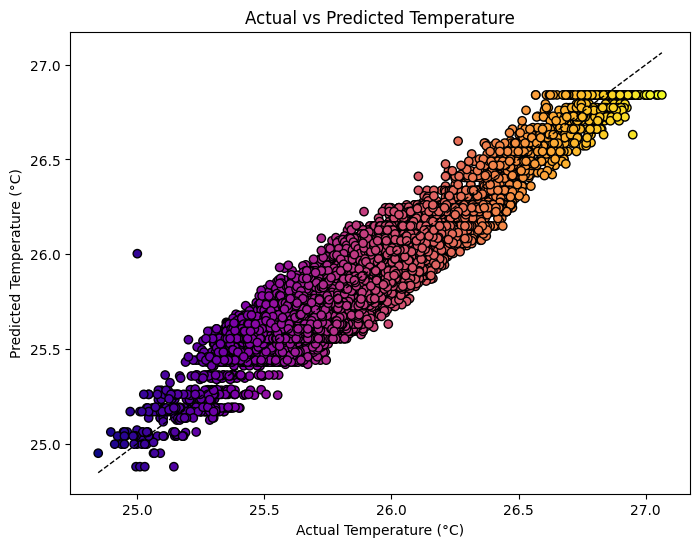

In [ ]:
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred, c=y_test, cmap='plasma', edgecolors='k')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1)
plt.xlabel('Actual Temperature (°C)')
plt.ylabel('Predicted Temperature (°C)')
plt.title('Actual vs Predicted Temperature')
plt.show()